In [2]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import imutils

(Text(0.5, 1.0, 'Hue Image'), ([], []), ([], []))

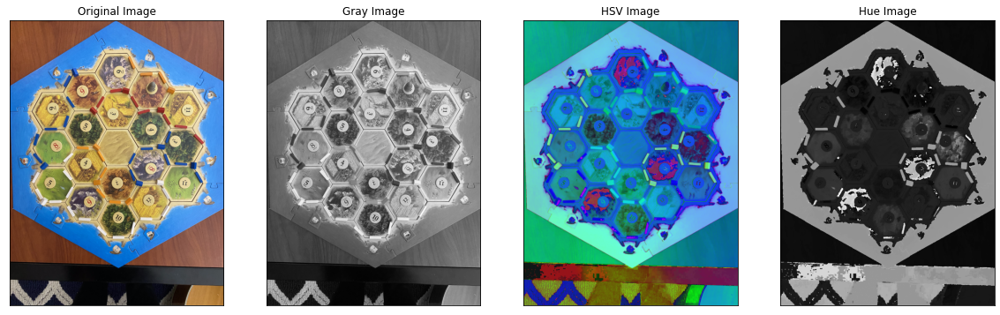

In [3]:
img_orig = cv.imread('photos/IMG_7875.png')

img_orig = imutils.resize(img_orig, width=1000)

img_gray = cv.cvtColor(img_orig, cv.COLOR_BGR2GRAY)
img = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)
img_hsv = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)
img_h = img_hsv[:,:,0]

plt.figure(figsize=(20,20))
plt.subplot(141)
plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142)
plt.imshow(img_gray, cmap='gray')
plt.title('Gray Image'), plt.xticks([]), plt.yticks([])
plt.subplot(143)
plt.imshow(img_hsv)
plt.title('HSV Image'), plt.xticks([]), plt.yticks([])
plt.subplot(144)
plt.imshow(img_h, cmap='gray')
plt.title('Hue Image'), plt.xticks([]), plt.yticks([])

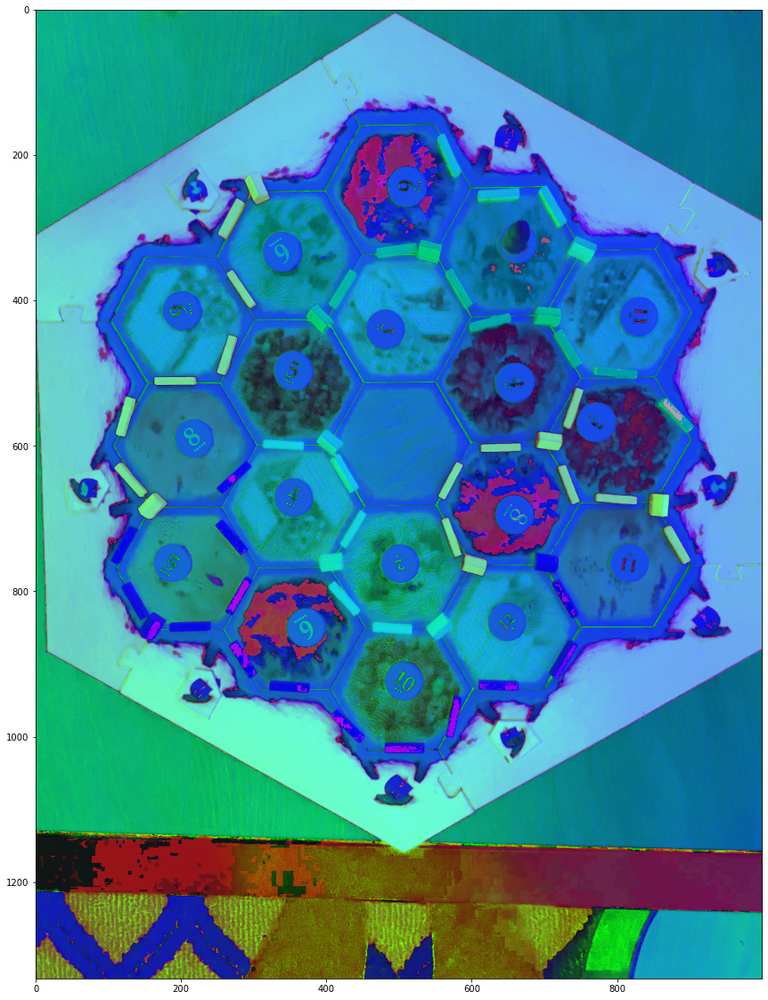

In [4]:
plt.figure(figsize=(20,20))
plt.imshow(img_hsv)

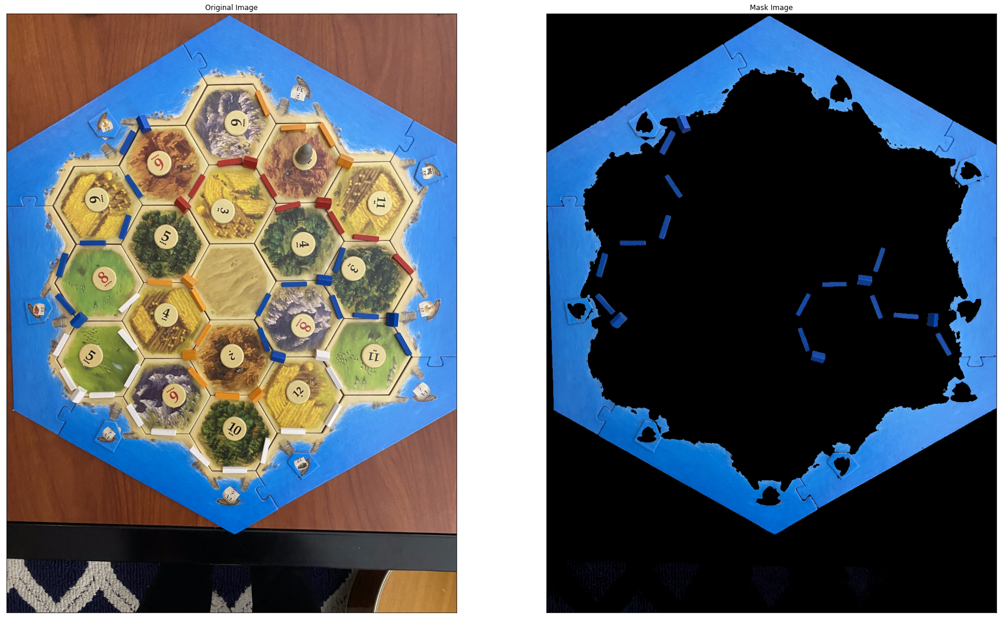

In [15]:
# FIND ROADS AND SETTLEMENTS IN IMAGE
# approach 2:
# 1. Filter the image into the HSV color space
# 2. Filter the image to only include the color range of the road

blue_lower = np.array([80, 140, 0])
blue_upper = np.array([140, 255, 255])

blue_mask = cv.inRange(img_hsv, blue_lower, blue_upper)

# see img
res = cv.bitwise_and(img,img, mask= blue_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

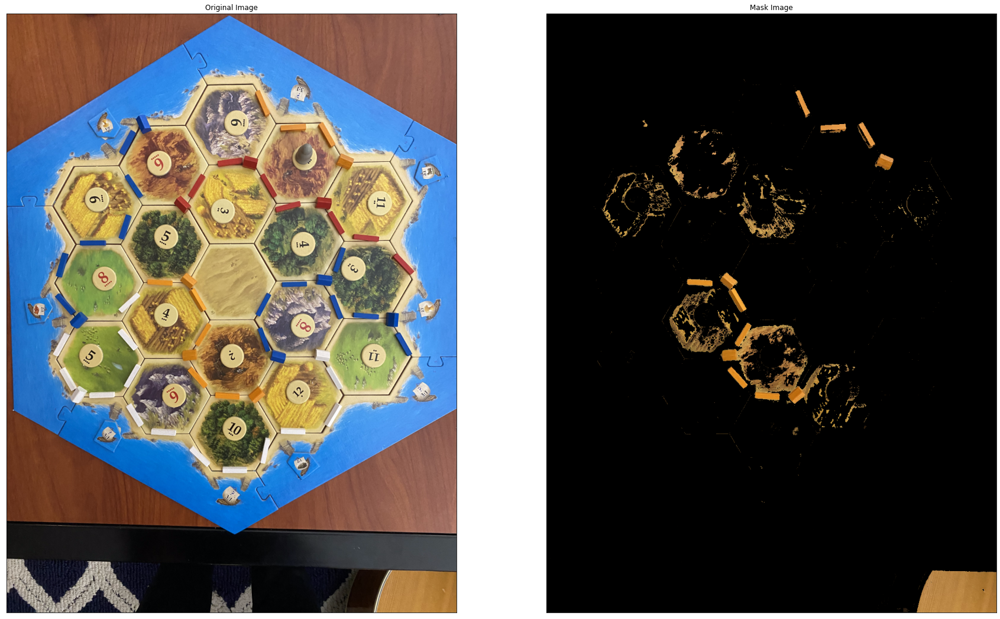

In [23]:
orange_lower = np.array([15, 140, 0])
orange_upper = np.array([20, 255, 255])

orange_mask = cv.inRange(img_hsv, orange_lower, orange_upper)

# see img
orange_res = cv.bitwise_and(img,img, mask= orange_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(orange_res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

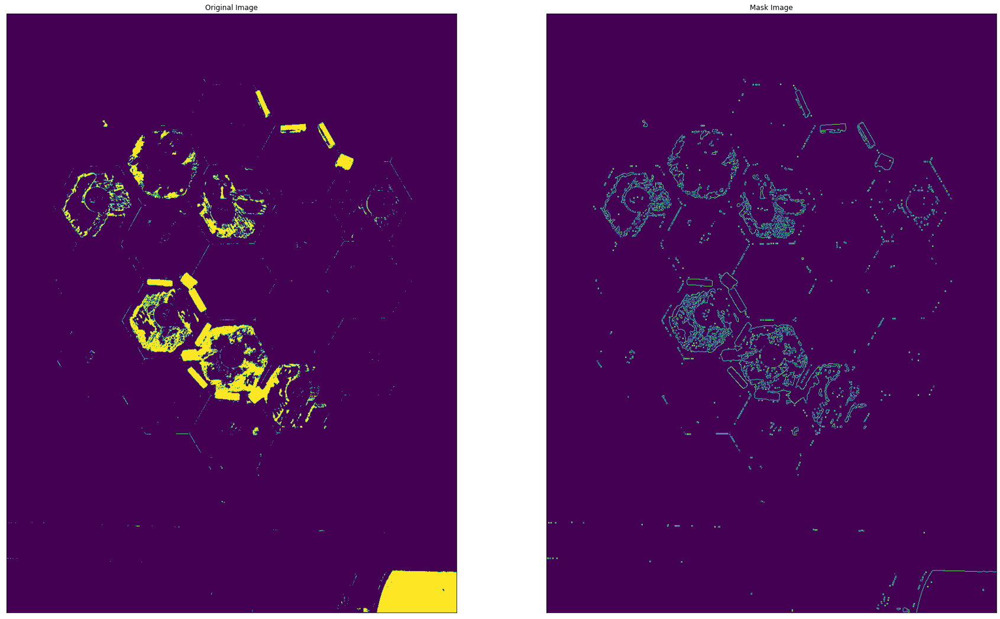

In [26]:
# get edges from orange mask
orange_edges = cv.Canny(orange_mask, 100, 200)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(orange_mask, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(orange_edges, cmap='gray')
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

In [6]:
# FIND ROADS AND SETTLEMENTS IN IMAGE
# approach:
# 1. use canny to detect lines in image
# 2. use hough transform to detect lines in image
# 3. group parallel lines together
# 4. group lines that are close together
# 5. profit??

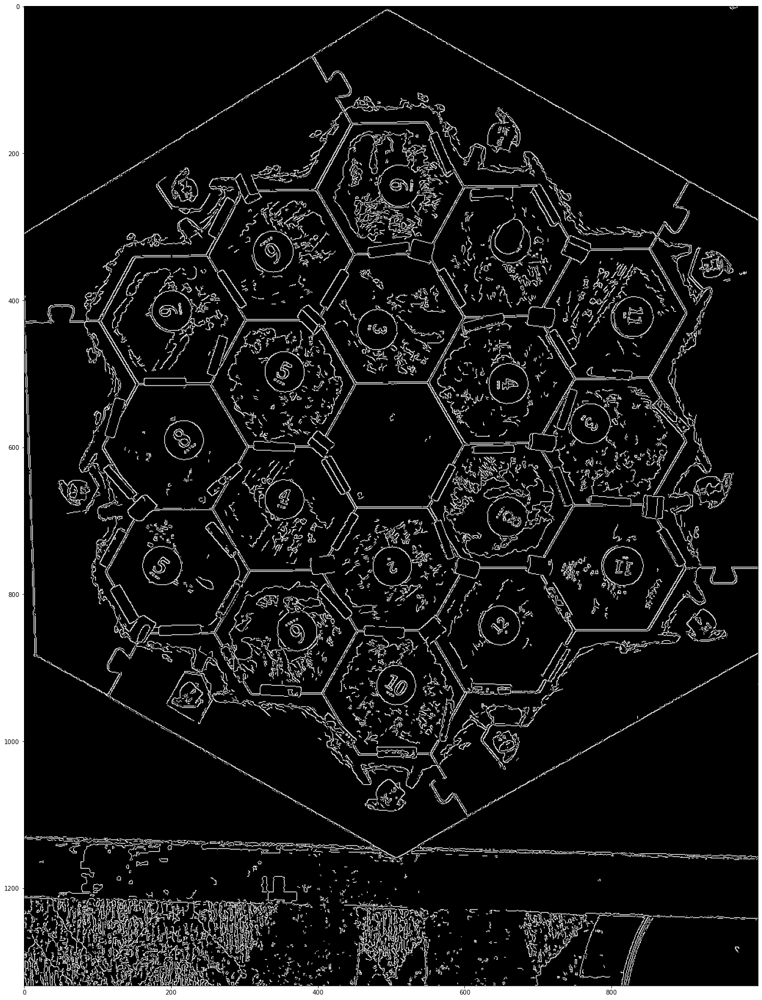

In [7]:
# resize image to speed up processing
# also roads look more uniform at smaller scale
# img_gray_resize = cv.resize(img_gray, (0,0), fx=0.5, fy=0.5)

# blur and threshold before applying canny
# blur = cv.GaussianBlur(img_hsv, (5,5), 0)
# thresh = cv.threshold(blur, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]
edges = cv.Canny(img_hsv, 200, 300)
# edges = cv.Canny(img_gray_resize, 300, 400)

plt.figure(figsize=(30, 30))
plt.imshow(edges, cmap='gray')

458


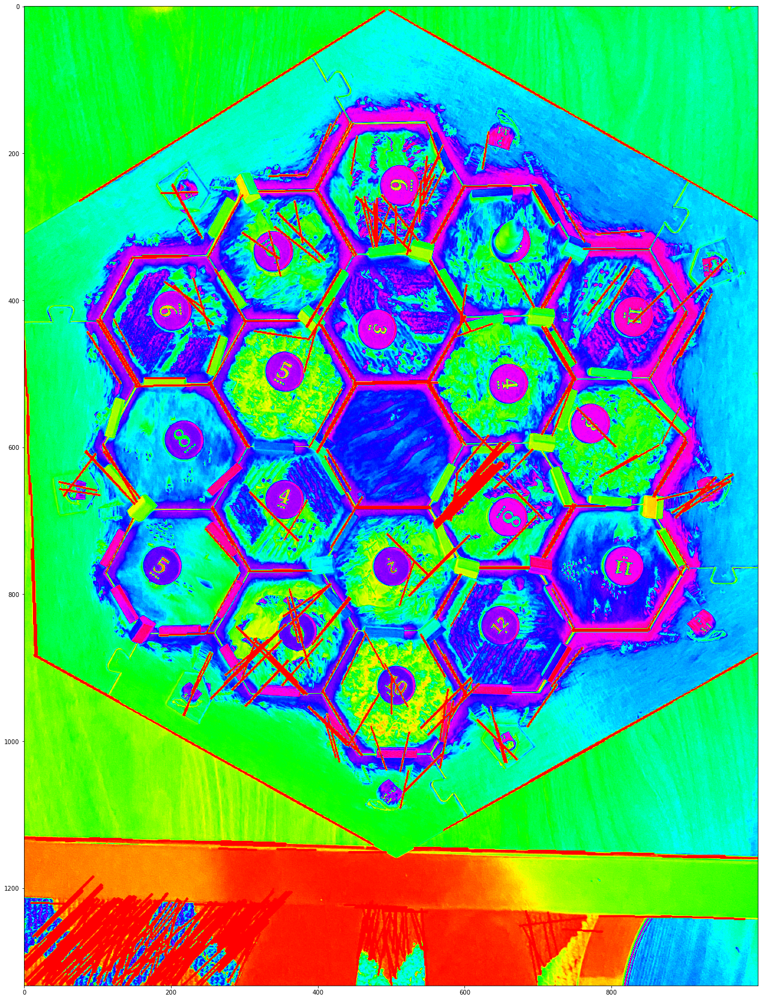

In [8]:
# 2. use hough transform to detect lines in image
tmp = img_gray.copy()

lines = cv.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=50, maxLineGap=10)
print(len(lines))

# draw lines on image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv.line(tmp, (x1, y1), (x2, y2), (0, 255, 0), 2)

# show image with lines
plt.figure(figsize=(30, 30))
plt.imshow(tmp, cmap='hsv')